In [1]:
%load_ext autoreload
%autoreload 2

import util
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# How to create our dataset used for presented experiments

In this notebook we show how we created our dataset used for all additional experiments conducted and presented in our paper. Please note that this code is provided for reproducability reasons and is not needed to run our main code, as we also provide an already preprossed dataset for these. However, we see it as inportant that every user can fully reconstruct how our data is created.

To run this notebook the user has to manually provide the raw [FairFace](https://github.com/joojs/fairface) and [OpenImagesV5](https://storage.googleapis.com/openimages/web/index.html) dataset files as described in the next section.

## Requirements

As our dataset is build on [FairFace](https://github.com/joojs/fairface) and
[OpenImagesV5 test-set](https://storage.googleapis.com/openimages/web/download.html) it is nessessary to provide the raw data manually. 

### FairFace dataset

Plese download the [FairFace padding=0.25 images](https://drive.google.com/file/d/1Z1RqRo0_JiavaZw2yzZG6WETdZQ8qX86/view?usp=sharing) + the [FairFace training-labels](https://drive.google.com/file/d/1i1L3Yqwaio7YSOCj7ftgk8ZZchPG7dmH/view?usp=sharing) and the [FairFace validation-labels](https://drive.google.com/file/d/1wOdja-ezstMEp81tX1a-EYkFebev4h7D/view?usp=sharing) into the folder **raw_data_fairface** that is created when you run the following cell.

In [2]:
raw_fair_face_dir = 'raw_data_fairface'
Path(raw_fair_face_dir).mkdir(exist_ok=True)

### OpenImages dataset V5 with bounding boxes

To download the **OpenImagesV5 validation(12GB) and test(36GB) images ** first install **awscli** by running `pip install awscli`. Then you can run

```aws s3 --no-sign-request sync s3://open-images-dataset/validation raw_open_images/```

and

```aws s3 --no-sign-request sync s3://open-images-dataset/test raw_open_images/``` 

to start the download to your home directory.

Furthermore, you need to download the [Class Names](https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv) + the [Validation-set  bounding boxes](https://storage.googleapis.com/openimages/v5/validation-annotations-bbox.csv) and [Test-Set bounding boxes](https://storage.googleapis.com/openimages/v5/test-annotations-bbox.csv).

Again, all of this should be placed into the folder **raw_data_open_images** that is created when you run the following cell.

In case you should have any problems downloading please check out the [OpenImages Downloadsection](https://storage.googleapis.com/openimages/web/download.html).

In [3]:
raw_open_images_dir = 'raw_data_open_images'
Path(raw_open_images_dir).mkdir(exist_ok=True)

### Check

The following cell runs a check to make sure all data is provided.

In [4]:
util.check_raw_data(raw_fair_face_dir, raw_open_images_dir)

Checking FairFace Files:
    Found fairface-img-margin025-trainval.zip
    Found fairface_label_train.csv
    Found fairface_label_val.csv
    All good!

Checking OpenImages Files:
    Found test-annotations-bbox.csv
    Found class-descriptions-boxable.csv
    Found validation-annotations-bbox.csv
    Found raw_open_images
        Checked number of images
    All good!



## Processing of OpenImages V5

As we use this dataset to create and Face Recognition Counterexample dataset we have to make sure it doesn't contain any human faces. Thus we start by removing images that do contain human related bounding boxes.

### Removing Human-related classes

The following 64 images are a random sample on the unfiltered dataset.

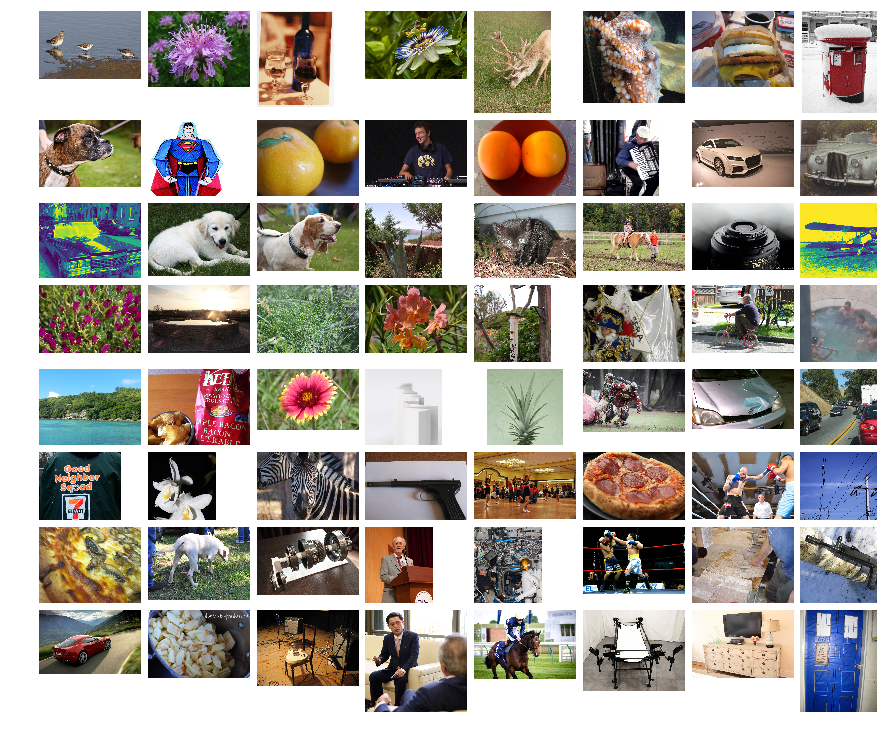

In [5]:
image_dir = raw_open_images_dir + '/raw_open_images'
util.plot_sample_images_dataset(image_dir)

Now we remove all classes in `classes_to_remove`.

Reduced number of images from 167056 to 102120 by deleting 17556 without bounding boxes and 47380 of invalid classes.
Random Selection of removed images without bounding boxes:


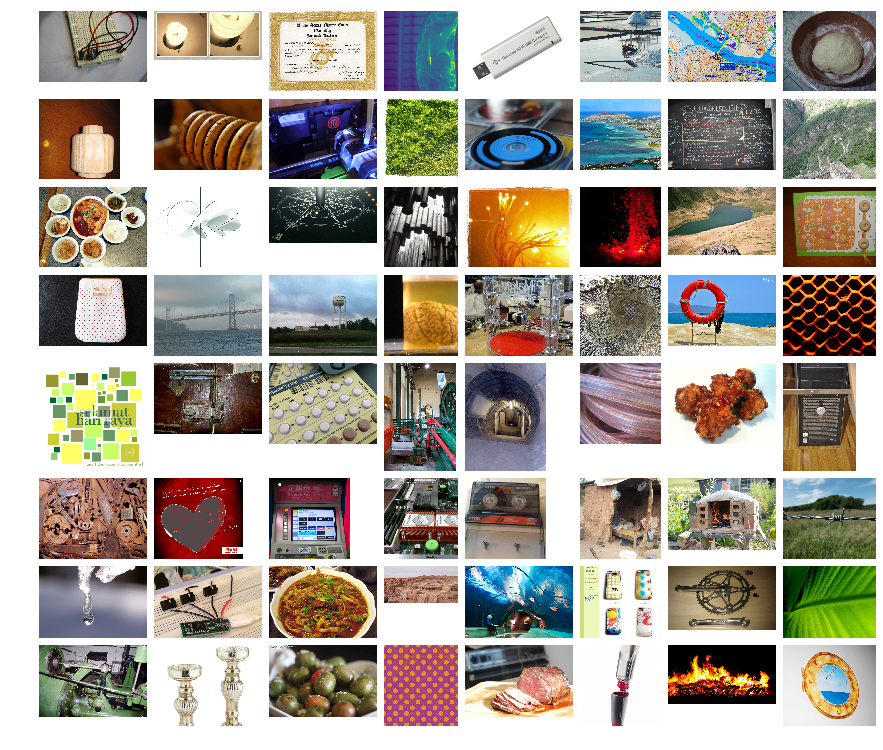

Random Selection of removed images with invalid class:


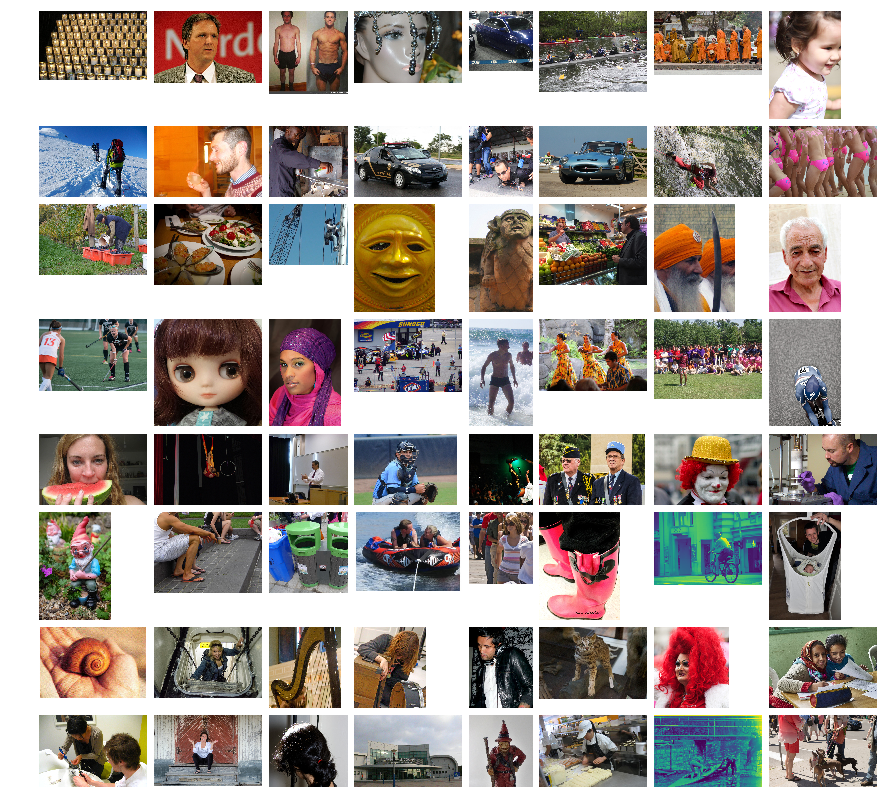

Random Selection of filtered dataset:


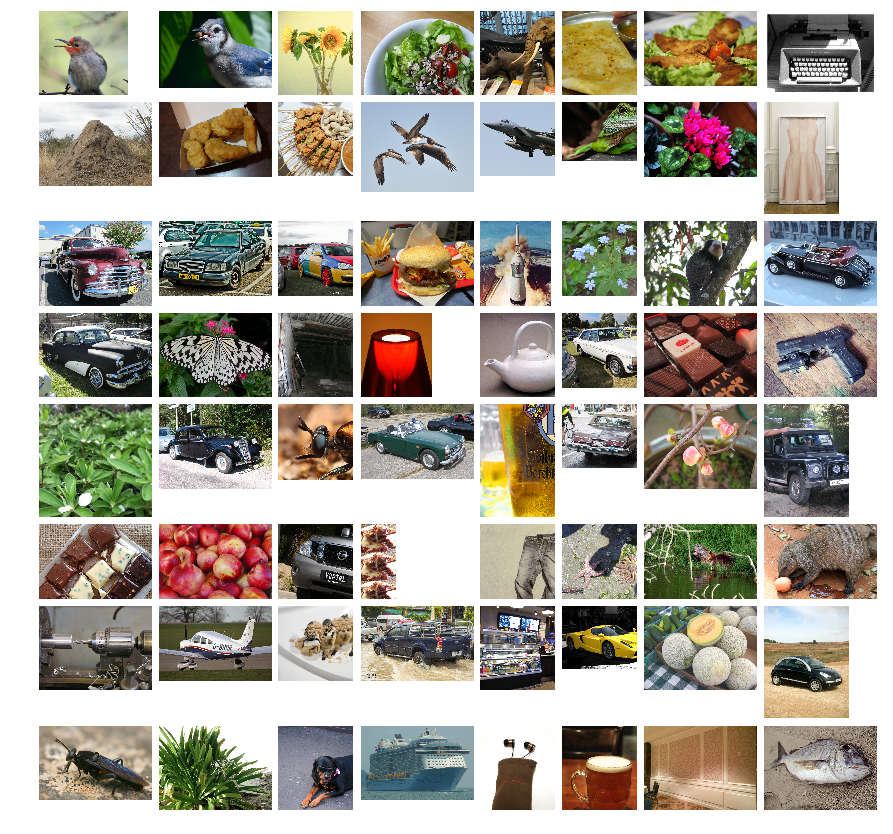

In [6]:
classes_to_remove = ['Human face', 'Human nose', 'Human ear', 'Human eye', 'Human beard', 'Human mouth',
                     'Human body', 'Human leg', 'Human hair', 'Human head','Human arm', 'Human hand', 
                     'Boy', 'Man', 'Person', 'Woman', 'Girl']
valid_image_names = util.remove_classes_from_open_images_dataset(raw_open_images_dir, classes_to_remove)

As we can see there are no human related images in the sample anymore. Furthermore, we can see the samples out of the removed portion of the dataset.

### Create Counterexample images

In this step we will use the remaining images to extract counterexamples for our face detection system. This will be done by randomly selecting one of the bounding boxes and then reshaping it to our model resolution of 64x64 pixels. As the bounding boxes are normally not square in nature and we want ot keep aspect ratio we first cut a random seleted square (with size min(height, width) out of the image.

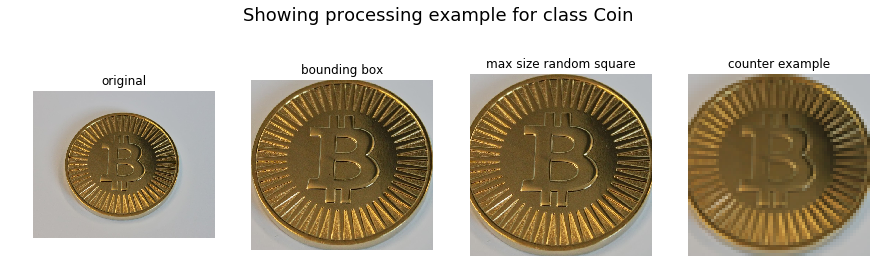

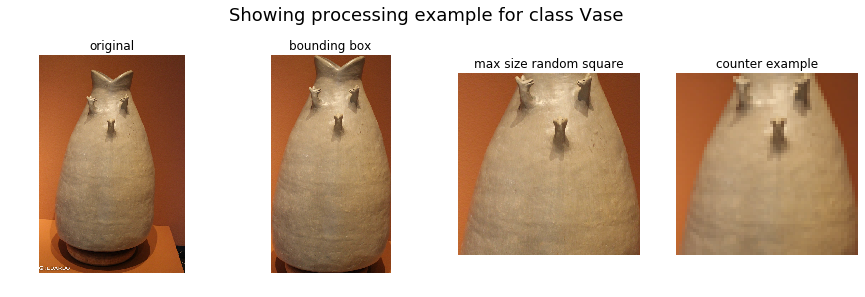

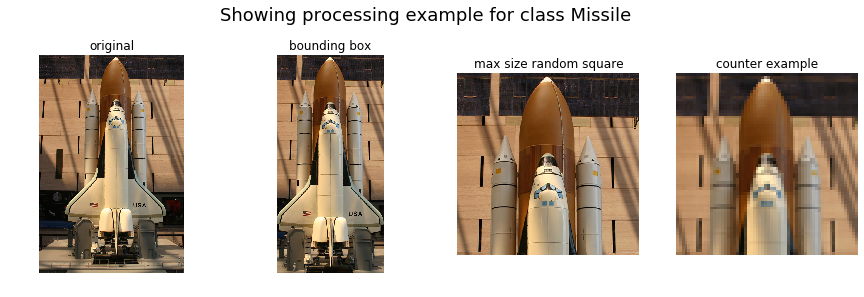

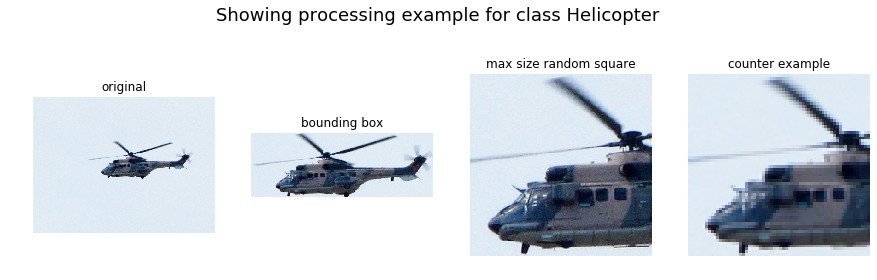

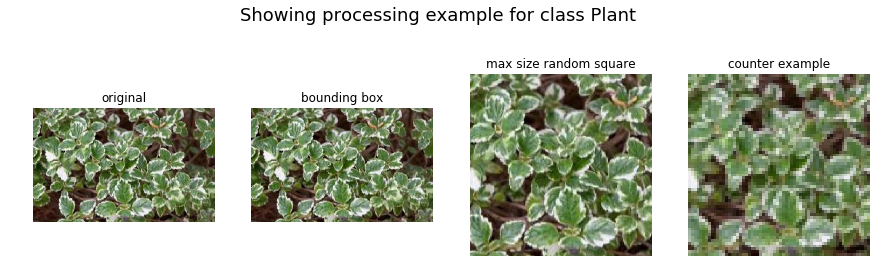

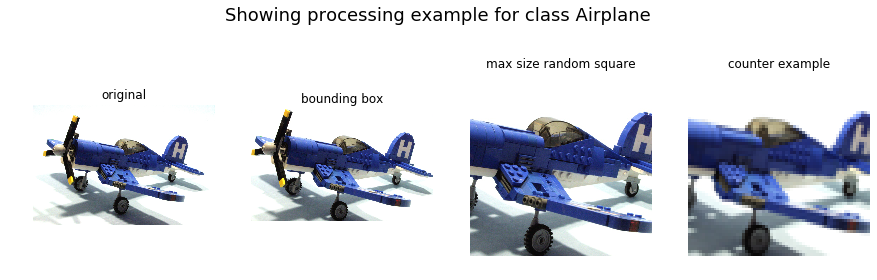

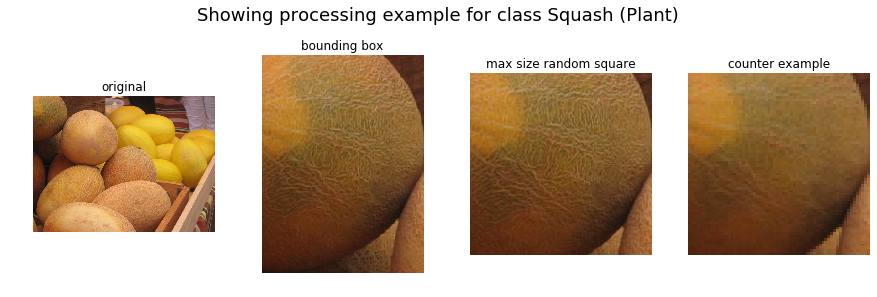

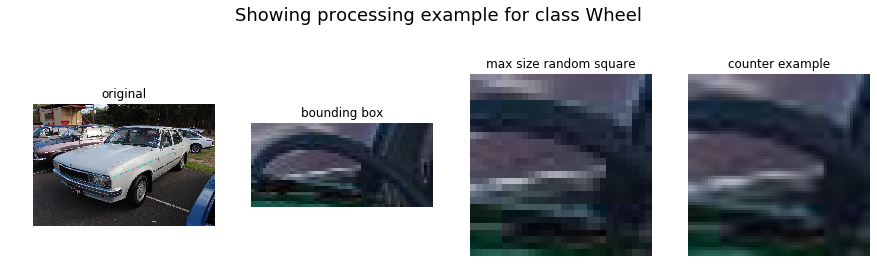

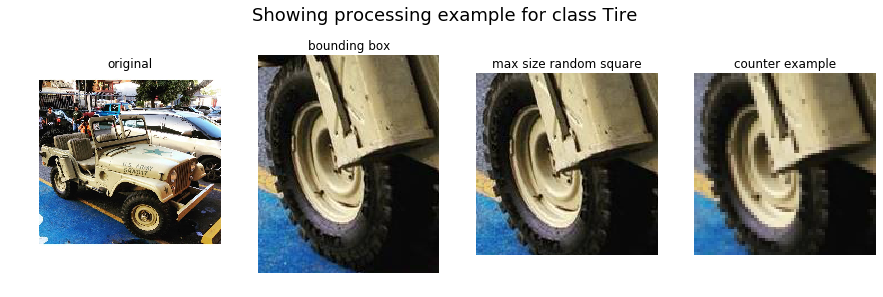

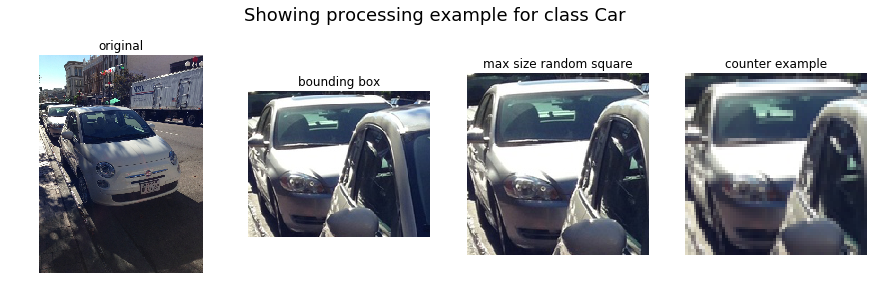

In [13]:
preprocessed_images_2_label = util.crop_bbox_resize_save(raw_open_images_dir, valid_image_names)

Here you can see some of the final cropped and resized images that will be used as counterexample to our face detection.

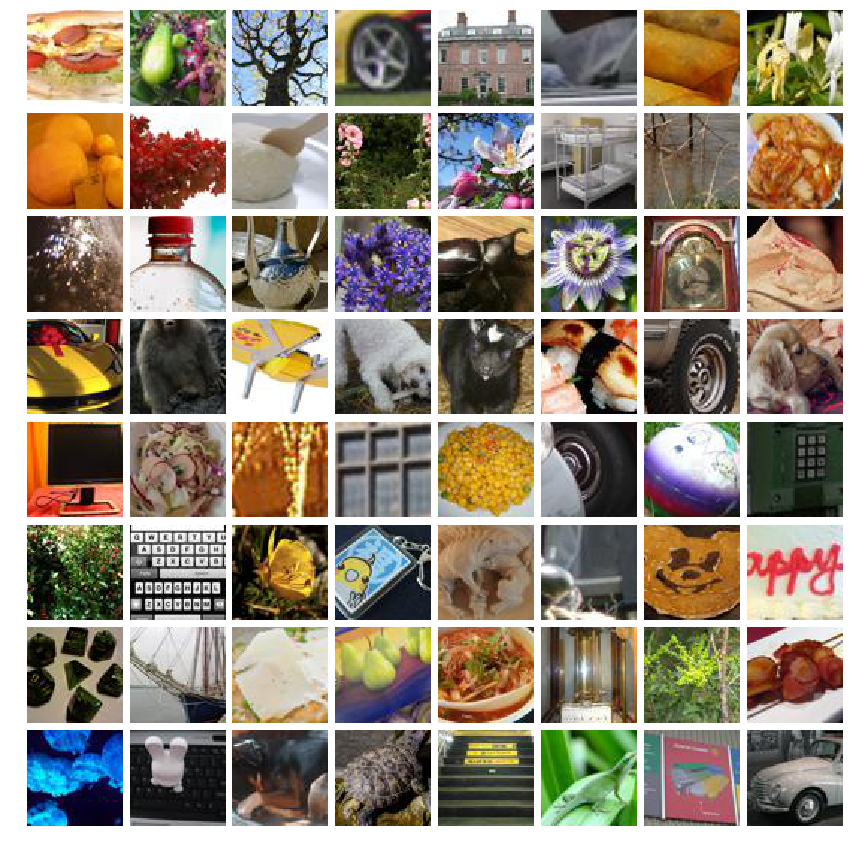

In [9]:
image_dir = raw_open_images_dir + '/cropped_and_resized_images'
util.plot_sample_images_dataset(image_dir)

Lastly, we reduce our dataset to a needed size and split into training and testing in the same ration (11% testing) as the FairFace dataset. All while keeping class distribution.

In [32]:
reduced_preprocessed_images_2_label = util.reduce_dataset_size_keep_class_dist(preprocessed_images_2_label)
util.split_train_test(raw_open_images_dir, reduced_preprocessed_images_2_label)

Reducing dataset from 102120 to 97698 samples...



Splitting dataset and writing to csv files in raw_data_open_images...


## Processing of FairFace dataset

In the case of FairFace dataset all we need to do is to resize all the images to a smaller resolution. Here are some random examples drawn from the dataset.



Random samples of FairFace dataset before resizing...


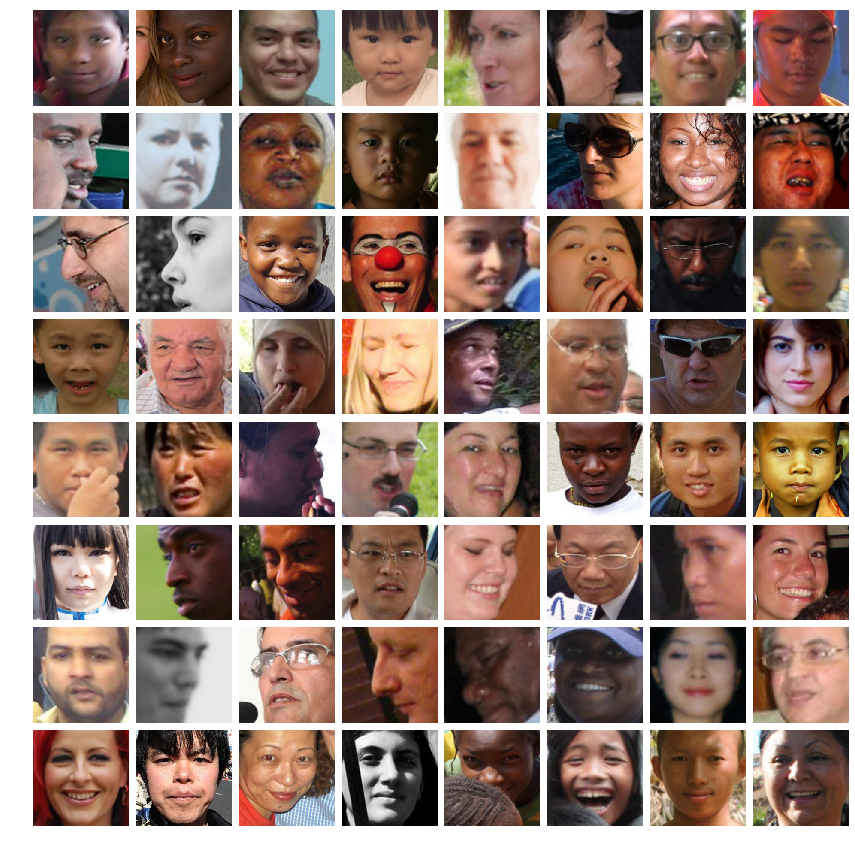

Resizing FairFace Images in /train...



Resizing FairFace Images in /val...



Random samples of FairFace dataset after resizing...


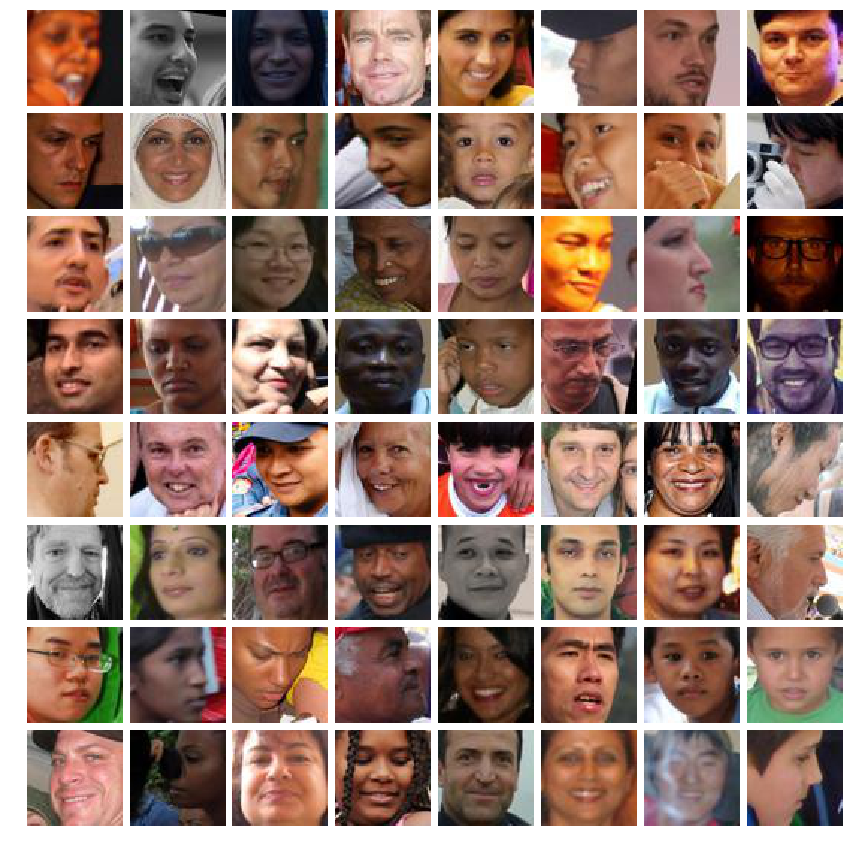

In [33]:
util.resize_fair_face_images(raw_fair_face_dir)

## Combining FairFace dataset and OpenImages

We can first transfer the images of FairFace a folder containing our dataset.

In [34]:
our_dataset_dir = 'our_dataset'
Path(our_dataset_dir).mkdir(exist_ok=True)

util.transfer_fairface_images(raw_fair_face_dir, our_dataset_dir)

Transferring FairFace train images...
    DONE!
Transferring FairFace val images...
    DONE!


In [35]:
util.transfer_open_images_images(raw_open_images_dir, our_dataset_dir)

Transferring OpenImages train images...
    DONE!
Transferring OpenImages val images...
    DONE!


In [36]:
util.create_label_csv(raw_fair_face_dir, raw_open_images_dir, our_dataset_dir)

Transferring train labels...
    Transferring FairFace train labels...
        DONE!
    Transferring OpenImages train labels...
        DONE!
Transferring val labels...
    Transferring FairFace val labels...
        DONE!
    Transferring OpenImages val labels...
        DONE!


That's it! We have sucessfully created our new dataset for investigating bias in face detection. Have fun!